In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from pathlib import Path
import seaborn as sns
from sklearn.cluster import DBSCAN
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import silhouette_score
import folium
from folium.plugins import MarkerCluster
from folium.plugins import HeatMap
import umap

/home/ym0r4l3s/projects/RIPS_Project/env/lib/python3.10/site-packages/requests/__init__.py:109: RequestsDependencyWarning: urllib3 (1.26.20) or chardet (5.2.0)/charset_normalizer (2.0.12) doesn't match a supported version!
  warnings.warn(
/home/ym0r4l3s/projects/RIPS_Project/env/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
BASE_DIR = Path().resolve().parents[0] 
csv_path = BASE_DIR / 'data' / 'processed' / 'Antioquia_2021_completed.csv'


In [3]:
df = pd.read_csv(csv_path)
df.head()

,a_o,tipoatencion,numeroatenciones,codigo_departamento,nombre_departamento,codigo_municipio,nombre_municipio,codigo_diagnostico,n_diagnostico,capitulo,latitud,longitud
0,2021,CONSULTAS,1,5,Antioquia,5501,Olaya,E02X,HIPOTIROIDISMO SUBCLINICO POR DEFICIENCIA DE YODO,"IV - Endocrinas, nutricionales y metabólicas",6.611418,-75.775671
1,2021,CONSULTAS,1,5,Antioquia,5501,Olaya,F069,TRASTORNO MENTAL NO ESPECIFICADO DEBIDO A LESI...,V - Mentales y de comportamiento,6.611418,-75.775671
2,2021,CONSULTAS,1,5,Antioquia,5501,Olaya,F412,TRASTORNO MIXTO DE ANSIEDAD Y DEPRESION,V - Mentales y de comportamiento,6.611418,-75.775671
3,2021,CONSULTAS,1,5,Antioquia,5501,Olaya,F510,INSOMNIO NO ORGANICO,V - Mentales y de comportamiento,6.611418,-75.775671
4,2021,CONSULTAS,1,5,Antioquia,5501,Olaya,F529,"DISFUNCION SEXUAL, NO OCASIONADA POR TRASTORNO...",V - Mentales y de comportamiento,6.611418,-75.775671


In [4]:
df.columns

Index(['a_o', 'tipoatencion', 'numeroatenciones', 'codigo_departamento',
       'nombre_departamento', 'codigo_municipio', 'nombre_municipio',
       'codigo_diagnostico', 'n_diagnostico', 'capitulo', 'latitud',
       'longitud'],
      dtype='object')

In [5]:
print(df.shape)
df.info()

(278271, 12)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 278271 entries, 0 to 278270
Data columns (total 12 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   a_o                  278271 non-null  int64  
 1   tipoatencion         278271 non-null  object 
 2   numeroatenciones     278271 non-null  int64  
 3   codigo_departamento  278271 non-null  int64  
 4   nombre_departamento  278271 non-null  object 
 5   codigo_municipio     278271 non-null  int64  
 6   nombre_municipio     278271 non-null  object 
 7   codigo_diagnostico   278271 non-null  object 
 8   n_diagnostico        278271 non-null  object 
 9   capitulo             277390 non-null  object 
 10  latitud              278271 non-null  float64
 11  longitud             278271 non-null  float64
dtypes: float64(2), int64(4), object(6)
memory usage: 25.5+ MB


In [6]:
#Heat map, number of medical services rendered

coords = df[['latitud', 'longitud', 'numeroatenciones']].dropna()

m = folium.Map(location=[6.5, -75.5], zoom_start=7)

HeatMap(data=coords[['latitud', 'longitud', 'numeroatenciones']].values, radius=15).add_to(m)

m


The heatmap shows a higher concentration of medical services rendered in Medellín, the main city of the Antioquia department. This is expected due to the large population of Medellín and the surrounding municipalities in the Aburrá Valley. There is also a smaller hotspot near Apartadó, located in the Urabá region of Antioquia.

In [7]:
# Filter by diagnosis

diag = 'I10X' #Essential (primary) hypertension
df_diag = df[df['codigo_diagnostico'] == diag]

m = folium.Map(location=[6.5, -75.5], zoom_start=7)

for _, row in df_diag.iterrows():
    if pd.notna(row['latitud']) and pd.notna(row['longitud']):
        folium.Circle(
            location=[row['latitud'], row['longitud']],
            radius = np.log1p(row['numeroatenciones']) * 500, # logarithmic scale
            popup=f"{row['nombre_municipio']} ({row['numeroatenciones']} atenciones)",
            color='blue',
            fill=True,
            fill_opacity=0.6
        ).add_to(m)

m


The map displays the distribution of medical services related to primary essential hypertension (ICD-10 code I10X) across the municipalities of the Antioquia department in 2021. A clear concentration of cases is observed in the Aburrá Valley region, particularly in Medellín and its metropolitan area. This trend aligns with population density, as this area is the most urbanized and populated in the department.

Additionally, there are smaller clusters of medical attention in the Urabá region, especially around the municipality of Apartadó, suggesting regional access to healthcare services or a notable prevalence of hypertension in that zone. Other scattered cases across the southwest and central parts of Antioquia reflect the broader reach of hypertension care services, albeit in lower volumes compared to the metropolitan area.

In [8]:
# Heatmap of Essential (primary) hypertension in Antioquia department 
m = folium.Map(location=[6.5, -75.5], zoom_start=7)

df_heat = df[df['codigo_diagnostico'] == 'I10X'].dropna(subset=['latitud', 'longitud'])

HeatMap(
    data=df_heat[['latitud', 'longitud', 'numeroatenciones']].values,
    radius=20
).add_to(m)

m

As observed in the EDA file, there is a large number of records in the database with a value of '1' in the 'codigo_diagnostico' column. As previously analyzed, this likely indicates missing or incomplete information and may not be useful for further analysis. Therefore, these records will be dropped from the dataset.

In [9]:
df = df.drop(df[df['codigo_diagnostico'] == '1'].index)
print(df.shape)

(278196, 12)


In [10]:
df['numeroatenciones'].sum()

18063156

## Algorithms for spatial analysis 

For the spatial analysis, the name of the municipality and its geographic coordinates (latitude and longitude) will be considered, along with the key variable: the number of medical services rendered.

In [11]:
df_geo = df[['nombre_municipio', 'codigo_diagnostico', 'numeroatenciones', 'latitud', 'longitud']].dropna()
df_geo = df_geo.copy()


In [12]:
df_geo = df_geo.groupby(['nombre_municipio', 'codigo_diagnostico', 'latitud', 'longitud']).agg({
    'numeroatenciones': 'sum'
}).reset_index()

In [13]:
df_geo

,nombre_municipio,codigo_diagnostico,latitud,longitud,numeroatenciones
0,Abejorral,A085,5.803728,-75.438474,1
1,Abejorral,A090,5.803728,-75.438474,2
2,Abejorral,A099,5.803728,-75.438474,3
3,Abejorral,A281,5.803728,-75.438474,1
4,Abejorral,A483,5.803728,-75.438474,1
...,...,...,...,...,...
181699,Zaragoza,Z952,7.474004,-74.858483,7
181700,Zaragoza,Z955,7.474004,-74.858483,1
181701,Zaragoza,Z958,7.474004,-74.858483,1
181702,Zaragoza,Z961,7.474004,-74.858483,57


The aim is to apply two different algorithms to explore whether there is a relationship between a specific diagnosis and certain regions within the Antioquia department. For the clustering process, the chosen methods are the DBSCAN algorithm and the K-Means technique.


# DBSCAN Algorithm

In [14]:
# Drop duplicated records
df_geo = df_geo.drop_duplicates(subset=['latitud', 'longitud'])

# Prepare data for the clustering
X = df_geo[['latitud', 'longitud']].values
X_scaled = StandardScaler().fit_transform(X)


In [15]:
resultados = []

for min_samples in [3, 4, 5, 6]:
    # Paso 1: Calcular k-distance para este min_samples
    neigh = NearestNeighbors(n_neighbors=min_samples)
    nbrs = neigh.fit(X_scaled)
    distances, indices = nbrs.kneighbors(X_scaled)
    k_distances = np.sort(distances[:, -1])  # distancia al k-ésimo vecino

    # Paso 2: Buscar el "codo" automáticamente con derivadas (opcional)
    # O manualmente elegir un rango razonable
    posibles_eps = np.round(np.linspace(0.3, 0.6, 7), 2)  # ej: [0.3, 0.35, ..., 0.6]

    for eps in posibles_eps:
        db = DBSCAN(eps=eps, min_samples=min_samples)
        labels = db.fit_predict(X_scaled)
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise = np.sum(labels == -1)

        # Calcular silhouette si hay al menos 2 clusters
        sil_score = -1
        if n_clusters >= 2:
            try:
                sil_score = silhouette_score(X_scaled, labels)
            except:
                pass

        resultados.append({
            'eps': eps,
            'min_samples': min_samples,
            'n_clusters': n_clusters,
            'n_noise': n_noise,
            'silhouette': sil_score
        })

# Mostrar resultados ordenados
df_resultados = pd.DataFrame(resultados)
df_resultados = df_resultados.sort_values(by=['n_clusters', 'silhouette'], ascending=[False, False])
print(df_resultados.head(10))

     eps  min_samples  n_clusters  n_noise  silhouette
12  0.55            4           3       10    0.425601
3   0.45            3           3       10    0.419691
4   0.50            3           3        8    0.405554
2   0.40            3           3       18    0.390732
0   0.30            3           3       27    0.170168
13  0.60            4           2        7    0.451212
5   0.55            3           2        4    0.444761
11  0.50            4           2       15    0.432958
1   0.35            3           2       25    0.380053
14  0.30            5           2       41    0.039938


A parameter sweep was performed to select the optimal values for eps and min_samples in the DBSCAN algorithm. The configuration eps = 0.55 and min_samples = 4 yielded the best balance, identifying 3 distinct clusters with only 10 data points classified as noise and a silhouette score of 0.43. This indicates a good separation between clusters and a meaningful spatial pattern.

In [16]:
# Drop duplicated records
df_geo = df_geo.drop_duplicates(subset=['latitud', 'longitud'])

# Prepare data for the clustering
X = df_geo[['latitud', 'longitud']].values
X_scaled = StandardScaler().fit_transform(X)

#  DBSCAN 
db = DBSCAN(eps=0.55, min_samples=4, n_jobs=-1) #Change eps and min samples parameters, default 0.5 and 3
df_geo['cluster'] = db.fit_predict(X_scaled)

# clusters on a map
m = folium.Map(location=[6.5, -75.5], zoom_start=7)
marker_cluster = MarkerCluster().add_to(m)

# colors 
colors = [
    'red', 'blue', 'green', 'purple', 'orange', 'darkred', 'lightred', 'beige',
    'darkblue', 'darkgreen', 'cadetblue', 'darkpurple', 'white', 'pink',
    'lightblue', 'lightgreen', 'gray'
]

for _, row in df_geo.iterrows():
    cluster_id = row['cluster']
    color = colors[cluster_id % len(colors)] if cluster_id != -1 else 'gray'
    
    folium.CircleMarker(
        location=[row['latitud'], row['longitud']],
        radius=3,  # avoid overlaping decreasing the variable
        color=color,
        fill=True,
        fill_opacity=0.6,
        popup=(
            f"Municipio: {row['nombre_municipio']}<br>"
            f"Diagnóstico: {row['codigo_diagnostico']}<br>"
            f"Cluster: {cluster_id}"
        )
    ).add_to(marker_cluster)


In [17]:
m

In [18]:
df_geo.groupby('cluster').agg({
    'nombre_municipio': 'nunique',
    'codigo_diagnostico': 'nunique',
    'numeroatenciones': 'sum'
}).rename(columns={
    'nombre_municipio': 'municipios_unicos',
    'codigo_diagnostico': 'diagnosticos_unicos'
}).sort_values('numeroatenciones', ascending=False)


,municipios_unicos,diagnosticos_unicos,numeroatenciones
cluster,,,
0,107,39,358
-1,10,7,28
2,4,3,11
1,4,4,5


DBSCAN identified three spatial clusters and a small set of outliers. Cluster 0 contains the majority of the data, encompassing 107 municipalities and 358 medical services, suggesting a widespread and consistent pattern of diagnosis distribution. Clusters 1 and 2 are much smaller, each consisting of 4 municipalities with lower numbers of services, potentially representing localized patterns. Only 10 municipalities (28 services) were classified as noise, indicating a strong spatial structure in the data.

In [19]:
# Group municipality and diagnosis code

df_geo['muni_diag'] = df_geo['nombre_municipio'] + ' (' + df_geo['codigo_diagnostico'] + ')'

cluster_detalle = df_geo.groupby('cluster')['muni_diag'].apply(lambda x: sorted(x.unique().tolist())).reset_index()
cluster_detalle.columns = ['cluster', 'municipios_y_diagnosticos']


In [20]:
for cluster_id, grupo in cluster_detalle.iterrows():
    print(f"\n🔹 Cluster {grupo['cluster']}:")
    for entrada in grupo['municipios_y_diagnosticos']:
        print(f"- {entrada}")



🔹 Cluster -1:
- Caceres (A012)
- Caucasia (A009)
- El Bagre (A010)
- Murindo (A099)
- Mutata (A059)
- Nechi (A009)
- Segovia (A059)
- Vigia Del Fuerte (A010)
- Yondo (A090)
- Zaragoza (A001)

🔹 Cluster 0:
- Abejorral (A085)
- Abriaqui (A150)
- Alejandria (A064)
- Amaga (A028)
- Amalfi (A047)
- Andes (A062)
- Angelopolis (A059)
- Angostura (A011)
- Anori (A009)
- Anza (A662)
- Argelia (A513)
- Armenia (A000)
- Barbosa (A009)
- Bello (A009)
- Belmira (A061)
- Betania (A062)
- Betulia (A090)
- Briceno (A010)
- Buritica (A090)
- Caicedo (A060)
- Caldas (A020)
- Campamento (A085)
- Canasgordas (A066)
- Caracoli (A059)
- Caramanta (A260)
- Carolina (A060)
- Cisneros (A084)
- Ciudad Bolivar (A009)
- Cocorna (A083)
- Concepcion (A084)
- Concordia (A085)
- Copacabana (A020)
- Dabeiba (A009)
- Don Matias (A038)
- Ebejico (A188)
- El Carmen De Viboral (A049)
- El Santuario (A021)
- Entrerrios (A060)
- Envigado (A000)
- Fredonia (A020)
- Frontino (A009)
- Giraldo (A060)
- Girardota (A009)
- Gomez

In [21]:
# Table of frequencies
tabla_frecuencias = df_geo.groupby(['cluster', 'codigo_diagnostico']).size().reset_index(name='frecuencia')


tabla_pivote = tabla_frecuencias.pivot(index='codigo_diagnostico', columns='cluster', values='frecuencia').fillna(0).astype(int)

# Sort more frequent 
tabla_pivote['total'] = tabla_pivote.sum(axis=1)
tabla_pivote = tabla_pivote.sort_values(by='total', ascending=False)

print(tabla_pivote)


cluster             -1   0  1  2  total
codigo_diagnostico                     
A009                 2  16  1  2     21
A060                 0  13  0  0     13
A090                 1   9  0  0     10
A059                 2   6  0  0      8
A000                 0   5  1  0      6
A020                 0   5  0  0      5
A062                 0   5  0  0      5
A010                 2   2  0  0      4
A069                 0   3  0  1      4
A049                 0   4  0  0      4
A064                 0   4  0  0      4
A085                 0   3  0  0      3
A001                 1   1  1  0      3
A028                 0   1  0  1      2
A038                 0   2  0  0      2
A047                 0   2  0  0      2
A084                 0   2  0  0      2
A083                 0   2  0  0      2
A058                 0   2  0  0      2
A099                 1   1  0  0      2
A150                 0   1  0  0      1
A158                 0   1  0  0      1
A013                 0   1  0  0      1


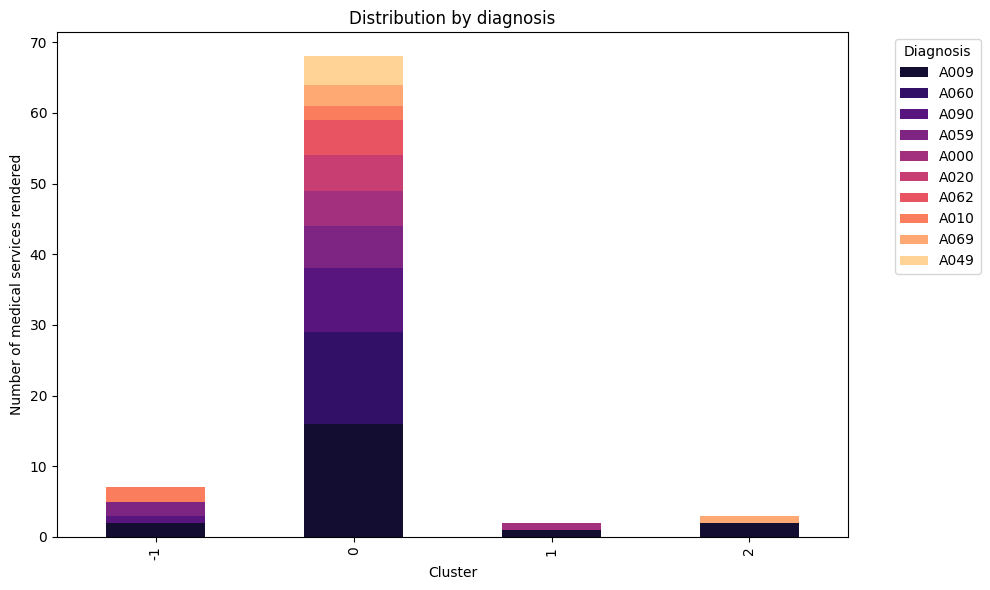

In [22]:
# Top 10 more common diagnosis 
top_diagnosticos = tabla_pivote.head(10).index

# Filter the top diagnosis
tabla_top = tabla_pivote.loc[top_diagnosticos].drop(columns='total')


# Plot colors
colores = sns.color_palette("magma", n_colors=len(tabla_top))

# Graph
tabla_top.T.plot(
    kind='bar',
    stacked=True,
    figsize=(10, 6),
    color=colores
)


plt.ylabel('Number of medical services rendered')
plt.xlabel('Cluster')
plt.title('Distribution by diagnosis')
plt.legend(title='Diagnosis', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


🔹 Cluster 0 — Large, dispersed core with a wide variety of diagnoses
Total: 98 municipalities listed here.

ICD-10 codes: Very diverse. Examples include:

A009 (diarrhea and gastroenteritis of presumed infectious origin): present in at least 10 municipalities.

A060 (amebiasis): appears repeatedly.

Other frequent codes: A000 (cholera), A059, A062, A049, A083, etc.

Interpretation:
This cluster is broad and includes rural, urban, and suburban areas, such as Medellín, Envigado, Rionegro, and many municipalities from eastern, southwestern, and northeastern Antioquia.
It shows a high variety of infectious disease diagnoses, suggesting a generalized distribution pattern across the department.

🔹 Cluster 1 — Northern Urabá: focal outbreak of infectious diseases
Municipalities: Apartadó, Carepa, Chigorodó, Turbo.

Diagnoses: A000, A001, A009, A048
(Cholera, typhoid fever, infectious diarrhea, shigellosis)

Interpretation:
This cluster represents a region with specific public health conditions, likely affected by socioeconomic vulnerability, poor sanitation, and endemic presence of enteric infections.
These patterns are typical of tropical areas with high humidity and limited infrastructure.

🔹 Cluster 2 — Southern Urabá: similar pattern, less intense
Municipalities: Arboletes, Necoclí, San Juan de Urabá, San Pedro de Urabá.

Diagnoses: A009, A028, A069
(Diarrhea, giardiasis, and other parasitic infections)

Interpretation:
This cluster shares similarities with Cluster 1, but possibly with lower population density or a more dispersed geographic pattern.

🔹 Cluster -1 (noise) — Dispersed or atypical zones
Municipalities: Caucasia, El Bagre, Segovia, Mutatá, Zaragoza...

Diagnoses: A009, A010, A012, A059, A001...

Geographic areas: Bajo Cauca, Magdalena Medio, and inner Urabá.

Interpretation:
These are municipalities that are likely far apart from one another or present low spatial density in the dataset. For this reason, DBSCAN classified them as noise, as they do not meet the criteria to be grouped into a cluster under the selected parameters.

# K-Means Algorithm

In [23]:
# Create matrix, nan values fill with 0
 
matriz = pd.pivot_table(
    df,
    index=['nombre_municipio', 'latitud', 'longitud'],
    columns='codigo_diagnostico',
    values='numeroatenciones',
    aggfunc='sum',
    fill_value=0
).reset_index()

# UMAP
X_umap = umap.UMAP(n_components=2, random_state=42).fit_transform(matriz.iloc[:, 3:])  # Columns 3+ are codes

# Clustering (K-Means)
from sklearn.cluster import KMeans
X_final = np.concatenate([X_umap, StandardScaler().fit_transform(matriz[['latitud', 'longitud']])], axis=1)


In order to determine the optimal number of clusters, the elbow method is applied. The best value for this parameter is identified by observing the change in inertia in the graph. Additionally, the Silhouette Score is used to support and validate this decision, the optimal number in this case is the highest value.

/home/ym0r4l3s/projects/RIPS_Project/env/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/ym0r4l3s/projects/RIPS_Project/env/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/ym0r4l3s/projects/RIPS_Project/env/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/ym0r4l3s/projects/RIPS_Project/env/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` 

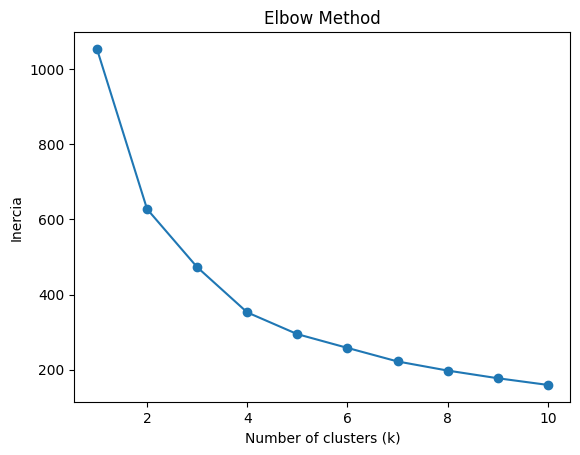

In [24]:
#Define amount of clusters

inertias = []
for k in range(1, 11):  # 1 to 10 clusters
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_final)  # X_final is the matrix with UMAP + lat/long
    inertias.append(kmeans.inertia_)

plt.plot(range(1, 11), inertias, marker='o')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Inercia')
plt.title('Elbow Method')
plt.show()

/home/ym0r4l3s/projects/RIPS_Project/env/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/ym0r4l3s/projects/RIPS_Project/env/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/ym0r4l3s/projects/RIPS_Project/env/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/ym0r4l3s/projects/RIPS_Project/env/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` 

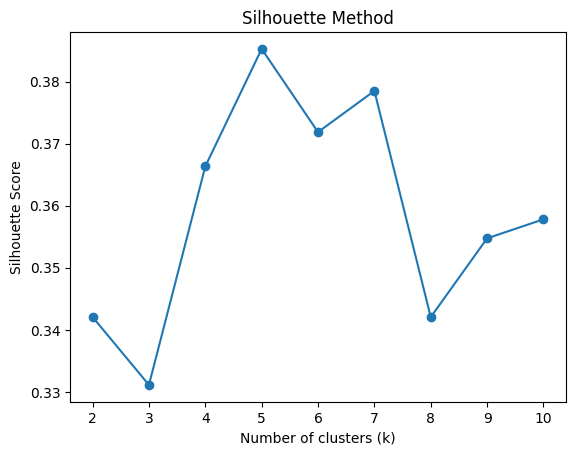

In [25]:
silhouette_scores = []
for k in range(2, 11):  # silhouette_score no funciona con k=1
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(X_final)
    score = silhouette_score(X_final, labels)
    silhouette_scores.append(score)

plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Method')
plt.show()

The n_clusters variable is set to 5. 

In [26]:
matriz['cluster'] = KMeans(n_clusters=5).fit_predict(X_final)

/home/ym0r4l3s/projects/RIPS_Project/env/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [27]:
import seaborn as sns
import matplotlib.colors as mcolors

# 1. Obtener 5 colores de la paleta 'magma'
colores_magma = sns.color_palette('magma', n_colors=5)

# 2. Convertir colores de RGB a formato hexadecimal (usado por folium)
colores_clusters = {i: mcolors.to_hex(color) for i, color in enumerate(colores_magma)}

# 3. Crear el mapa como antes
import folium

m = folium.Map(location=[6.5, -75.5], zoom_start=8)

for idx, row in matriz.iterrows():
    folium.CircleMarker(
        location=[row['latitud'], row['longitud']],
        radius=6,
        color=colores_clusters[row['cluster']],
        fill=True,
        fill_opacity=0.7,
        popup=f"""
        Municipio: {row['nombre_municipio']}<br>
        Cluster: {row['cluster']}
        """
    ).add_to(m)

# Mostrar el mapa si estás en Jupyter/Colab
m


In [28]:
print(matriz['cluster'].value_counts())

1    33
3    29
2    29
0    27
4     7
Name: cluster, dtype: int64


In [29]:
# Unique clusters in the dataset
clusters_presentes = np.sort(matriz['cluster'].unique())

for cluster in clusters_presentes:
    print(f"\nCluster {cluster}:")
    top_diagnosticos = matriz[matriz['cluster'] == cluster].iloc[:, 3:-1].mean().nlargest(3)
    print(top_diagnosticos)


Cluster 0:
codigo_diagnostico
Z718    51894.555556
I10X    37723.000000
R448    16077.740741
dtype: float64

Cluster 1:
codigo_diagnostico
Z017    473.363636
I10X    434.090909
Z108    373.515152
dtype: float64

Cluster 2:
codigo_diagnostico
I10X    10692.310345
Z012     4549.344828
Z298     3639.620690
dtype: float64

Cluster 3:
codigo_diagnostico
R448    2224.896552
I10X     555.655172
Z017     309.724138
dtype: float64

Cluster 4:
codigo_diagnostico
R69X    13424.142857
I10X    11538.857143
R448     9765.571429
dtype: float64


Cluster Interpretation Summary

Cluster 0: Characterized by vague or unspecified diagnoses (e.g., R69X), along with hypertension (I10X) and general symptoms (R448). This may reflect areas with lower diagnostic precision or limited access to specialized healthcare.

Cluster 1: Dominated by counseling services (Z718), hypertension (I10X), and general symptoms. Likely represents urban areas with strong preventive care and psychosocial support services.

Cluster 2: Focused on hypertension (I10X), general check-ups (Z012), and immunization needs (Z298). Suggests regions with active preventive healthcare programs.

Cluster 3: Includes medical certificates (Z017), hypertension, and infectious disease screenings (Z108). Possibly linked to areas with occupational or institutional health requirements.

Cluster 4: Shows low counts across diagnoses, mainly general symptoms and hypertension. Likely represents rural or underserved areas with limited healthcare utilization.